In [1]:
import os
import argparse
import torch
import math
import random
import numpy as np
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.optim.lr_scheduler import CosineAnnealingLR, StepLR

from torch.utils.data import DataLoader
from torch.utils.data import Dataset, DataLoader
import sklearn.metrics as metrics
from skimage.exposure import rescale_intensity
from skimage import morphology
from scipy import ndimage

from tqdm.notebook import tqdm
from importlib import reload

import pydicom as dicom
import pylibjpeg

import matplotlib.pyplot as plt
import cv2

#imports from vfit
# import config
import myutils
from loss import Loss
import shutil
import os
import time

from patchify import patchify

In [2]:
# connect to wandb
import wandb
wandb.init(project="VFIT-DBT")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: fsr (treely). Use `wandb login --relogin` to force relogin


In [3]:
# read in the config-defaults.yaml file into a python dict
import yaml
config_dict = yaml.load(open('wandb_config/config-defaults.yaml'), Loader=yaml.FullLoader)

sweep_id = wandb.sweep(config_dict, project="VFIT-DBT")

Create sweep with ID: v7edambh
Sweep URL: https://wandb.ai/treely/VFIT-DBT/sweeps/v7edambh


In [4]:
# # reload the model.VFIT_S import UNet_3D_3D
# import model.VFIT_S
# reload(model.VFIT_S)
# joinTypes = ["concat" , "add" , "none"]
# model = model.VFIT_S.UNet_3D_3D( n_inputs=6, joinType=joinTypes[0]).to("cuda")
# print("number of parameters: ", sum(p.numel() for p in model.parameters() if p.requires_grad))
# model.train()
# # generate a random 3x1024x1024 tensor
# # [batch_size, channels, height, width]
# x = torch.randn(1,1,256, 256).to("cuda")
# images = [x, x, x, x, x, x]
# print("singular image shape: ",images[0].shape)

# # pass the tensor through the model
# y = model(images)

# # WE want model input to be [batch_size, channels, T, height, width]

In [5]:
def build_training_dataset(config):
    if config == None:
        batch_size = 4
        num_adjacent_slices = 3
    else:
        batch_size = config.batch_size
        num_adjacent_slices = config.num_adjacent_slices
        pass


    class DICOM_Dataset(Dataset):
        def __init__(self, data_dir, transform=None):
            self.data_dir = data_dir
            self.transform = transform
            self.data = []
            # walk through the directory and get all the .dcm files
            for root, dirs, files in os.walk(data_dir):
                for file in files:
                    if file.endswith('.npy'):
                        self.data.append(os.path.join(root, file))
            self.data.sort()

        def __len__(self):
            return len(self.data)


        def __preproc__(self, filepath):
            """ Read in the .npy file from the filepath and allow pickling """

            pixel_array = np.load(filepath, allow_pickle=True)
            
            """ Get a random set of 3 adjacent slices """
            random_start_slice = random.randint(0, pixel_array.shape[0] - num_adjacent_slices)
            slices = pixel_array[random_start_slice:random_start_slice + num_adjacent_slices] 

            return slices


        def __getitem__(self, idx):
            filepath = self.data[idx]
            slices = self.__preproc__(filepath)
            # convert numpy array to dtype float32
            slices = slices.astype(np.float32)
            if self.transform:
                slices = self.transform(slices)

            # add a channel dimension to the slices
            slices = np.expand_dims(slices, axis=1)
            # duplicate the slices to make a 3 channel image
            slices = np.repeat(slices, 3, axis=1)
            # parse out the middle slice and store it as gt
            gt = slices[num_adjacent_slices // 2]
            # remove the middle slice from the list of slices
            slices = np.delete(slices, num_adjacent_slices // 2, 0)
            # convert the slices to a tensor
            slices = torch.from_numpy(slices)
            # convert the gt to a tensor
            gt = torch.from_numpy(gt)

            return (slices, gt)

    train_dataset = DICOM_Dataset(data_dir='data_np/training', transform=None)
    train_loader = DataLoader(train_dataset, batch_size=config.batch_size, shuffle=True, drop_last=True)
    return train_loader

In [6]:
def get_args(config):
    import argparse

    # read the config-defaults.yaml file and store it in a dictionary

    arg_lists = []
    parser = argparse.ArgumentParser()

    def add_argument_group(name):
        arg = parser.add_argument_group(name)
        arg_lists.append(arg)
        return arg

    # Dataset
    data_arg = add_argument_group('Dataset')
    data_arg.add_argument('--dataset', type=str, default='vimeo90K_septuplet')
    data_arg.add_argument('--data_root', type=str, default='/home/zhihao/DATA-M2/video_interpolation/vimeo_septuplet/')

    # data_arg.add_argument('--dataset', type=str, default='Davis')
    # data_arg.add_argument('--data_root', type=str, default='/home/zhihao/DATA-M2/video_interpolation/Davis/')

    # data_arg.add_argument('--dataset', type=str, default='ucf101')
    # data_arg.add_argument('--data_root', type=str, default='/home/zhihao/DATA-M2/video_interpolation/UCF/')

    # Model
    model_arg = add_argument_group('Model')
    model_choices = ["VFIT_S", "VFIT_B"]
    model_arg.add_argument('--model', choices=model_choices, type=str, default=config.model_choice)
    model_arg.add_argument('--nbr_frame' , type=int , default= config.num_adjacent_slices-1)
    model_arg.add_argument('--joinType' , choices=["concat" , "add" , "none"], default="concat")

    # Training / test parameters
    learn_arg = add_argument_group('Learning')
    learn_arg.add_argument('--loss', type=str, default='1*L1')
    learn_arg.add_argument('--lr', type=float, default=config.learning_rate)
    learn_arg.add_argument('--beta1', type=float, default=0.9)
    learn_arg.add_argument('--beta2', type=float, default=0.999)
    learn_arg.add_argument('--batch_size', type=int, default=config.batch_size)
    learn_arg.add_argument('--test_batch_size', type=int, default=12)
    learn_arg.add_argument('--start_epoch', type=int, default=0)
    learn_arg.add_argument('--max_epoch', type=int, default=100)
    learn_arg.add_argument('--resume', action='store_true')
    learn_arg.add_argument('--resume_exp', type=str, default=None)
    learn_arg.add_argument('--checkpoint_dir', type=str ,default=".")
    learn_arg.add_argument("--load_from"  ,type=str , default='checkpoints/VFIT_B/model_best.pth')
    learn_arg.add_argument("--pretrained" , type=str,
                            help="Load from a pretrained model.")

    # Misc
    misc_arg = add_argument_group('Misc')
    misc_arg.add_argument('--exp_name', type=str, default='exp')
    misc_arg.add_argument('--log_iter', type=int, default=100)
    misc_arg.add_argument('--num_gpu', type=int, default=1)
    misc_arg.add_argument('--random_seed', type=int, default=103)
    misc_arg.add_argument('--num_workers', type=int, default=1)
    misc_arg.add_argument('--val_freq', type=int, default=1)

    def get_args():
        """Parses all of the arguments above
        """
        args, unparsed = parser.parse_known_args()
        if args.num_gpu > 0:
            setattr(args, 'cuda', True)
        else:
            setattr(args, 'cuda', False)
        if len(unparsed) > 1:
            print("Unparsed args: {}".format(unparsed))
        return args, unparsed
    
    return get_args()


In [7]:






# scheduler = CosineAnnealingLR(optimizer, args.epochs, eta_min=1e-3)

In [8]:
def train(config = None):
    # Initialize a new wandb run
    with wandb.init(config=config):
        
        # If called by wandb.agent, as below,
        # this config will be set by Sweep Controller
        config = wandb.config

        ##### Parse CmdLine Arguments #####
        args, unparsed = get_args(config)
        save_loc = os.path.join(args.checkpoint_dir, "checkpoints")

        device = torch.device('cuda' if args.cuda else 'cpu')
        # torch.backends.cudnn.enabled = True
        # torch.backends.cudnn.benchmark = True

        torch.manual_seed(args.random_seed)
        if args.cuda:
            torch.cuda.manual_seed(args.random_seed)
        
        torch.cuda.empty_cache()
        
        # losses, psnrs, ssims = myutils.init_meters(args.loss)

        if config.model_choice == 'VFIT_S':
            from model.VFIT_S import UNet_3D_3D
        elif config.model_choice == 'VFIT_B':
            from model.VFIT_B import UNet_3D_3D

        print("Building model: %s"%config.model_choice)
        model = UNet_3D_3D( n_inputs=config.num_adjacent_slices-1, joinType=args.joinType).to(device)
        # load the checkpoint pretrained model
        model.load_state_dict(torch.load("checkpoints\VFIT_epoch_patches_0_batch_150.pth"))
        total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        print('the number of network parameters: {}'.format(total_params))

        ##### Define Loss & Optimizer #####
        criterion = nn.L1Loss()

        # from torch.optim import Adamax
        # optimizer = Adamax(model.parameters(), lr=args.lr, betas=(args.beta1, args.beta2))
        optimizer = optim.Adam(model.parameters(), lr=config.learning_rate, weight_decay=1e-4)
        scheduler = CosineAnnealingLR(optimizer, config.epochs, last_epoch=-1)

        model.train()
        
        train_loader = build_training_dataset(config)

        pbar = tqdm(range(5,config.epochs))

        gradient_accumulations = 16
        patch_num = 0

        optimizer.zero_grad()
        for epoch in pbar:
            avg_epoch_loss = []
            print("Epoch : ", epoch)
            ####################
            # Train
            ####################           

            for batch_idx, (images, gt_image) in enumerate(train_loader):
                # images is [batch_size, num_slices, channels, height, width]
                # ie. [1, 2, 3, 2048, 2048]
                # gt_image is [batch_size, channels, height, width]
                # ie. [1, 3, 2048, 2048]
                # patchify each slice in images to 256x256 resolution

                # make images and gt_image a numpy array
                images = images.numpy()
                gt_image = gt_image.numpy()
                
                # make blank numpy arrays to store the patches
                images_patches = np.zeros((images.shape[0], images.shape[1], 8, 8, images.shape[2], 256, 256), dtype=np.float32)
                gt_image_patches = np.zeros((gt_image.shape[0], 8, 8, gt_image.shape[1], 256, 256), dtype=np.float32)

                for batch in range(images.shape[0]):
                    for slice in range(images.shape[1]):
                        print("Shape of image: ", images[batch, slice].shape)
                        images_patches[batch, slice] = patchify(images[batch, slice], (3, 256, 256), step=256)
                        print("Shape of image after patchify: ", images_patches[batch, slice].shape)
                        
                    gt_image_patches[batch] = patchify(gt_image[batch], (3, 256, 256), step=256)
                # now images_patches is [batch_size, slices, 8, 8, 3, 256, 256]
                # and gt_image_patches is [batch_size, 8, 8, 3, 256, 256]
                # make it [batch_size, slices, 8*8, 3, 256, 256]
                # make gt [batch_size, 8*8, 3, 256, 256]
                images = images_patches.reshape(images_patches.shape[0], images_patches.shape[1], images_patches.shape[2]*images_patches.shape[3], images_patches.shape[4], images_patches.shape[5], images_patches.shape[6])
                gt_image = gt_image_patches.reshape(gt_image_patches.shape[0], gt_image_patches.shape[1]*gt_image_patches.shape[2], gt_image_patches.shape[3], gt_image_patches.shape[4], gt_image_patches.shape[5])
                    
                # make images and gt_image a torch tensor
                images = torch.from_numpy(images)
                gt_image = torch.from_numpy(gt_image)

                # perform model forward pass on each patch
                avg_patch_loss = []
                print("Working on batch: ", batch_idx, " of ", len(train_loader))
                
                for patch in range(images.shape[2]):
                    # we want slices of image_patch to be [batch_size, slices, 3, 256, 256]
                    # and gt_image_patch to be [batch_size, 3, 256, 256]
                    slices_of_image_patch = images[:, :, patch, :, :, :]
                    gt_image_patch = gt_image[:, patch, :, :, :]

                    slices_of_image_patch = slices_of_image_patch.to(device)
                    gt_image_patch = gt_image_patch.to(device)

                    slices_of_image_patch = slices_of_image_patch.float()
                    gt_image_patch = gt_image_patch.float()

                    """ Verify that gt patch isn't black """
                    if torch.sum(gt_image_patch) == 0:
                        # skip this patch
                        continue 

                    """ Verify that the patch contains values between 0 and 1 """
                    if torch.max(slices_of_image_patch) > 1 or torch.min(slices_of_image_patch) < 0:
                        # skip this patch
                        continue 

                    # when we get images from the dataloader, it is of shape [batch_size, T, C, 256, 256]
                    # extract each slice and make it of shape [batch_size, C, 256, 256] and put all slices in a list
                    slices_of_image_patch = [slices_of_image_patch[:,i,:,:,:] for i in range(slices_of_image_patch.shape[1])]
                    # permute to [batch_size, C, T, H, W]
                    # images = [img_.to(device) for img_ in images]
                    # print("img shape: ", images[0].shape)

                    batch_size = gt_image.size()[0]


                    # Forward
                    out_ll, out_l, out = model(slices_of_image_patch)
                    
                    
                    loss = criterion(out, gt_image_patch)
                    avg_patch_loss += [loss.item()]
                    
                    (loss / gradient_accumulations).backward()

                    """ Gradient clipping"""
                    if (patch_num + 1) % gradient_accumulations == 0:
                        optimizer.step()
                        model.zero_grad()
                    patch_num += 1
                
                    # print("Calculating Metrics")
                    
                    # myutils.eval_metrics(out, gt, psnrs, ssims)

                    print('Train Epoch: {} [{}/{}]:: Sub Epoch[{}/{}]\tLoss: {:.6f}\t Lr:{:.6f}'.format(
                        epoch, batch_idx, len(train_loader), patch, len(range(images.shape[2])), loss.item() , optimizer.param_groups[0]['lr'], flush=True))

                    # Reset metrics
                    # losses, psnrs, ssims = myutils.init_meters(args.loss)
                
                # after 50 batches, save the model and put the loss in the wandb log
                if batch_idx % 50 == 0:
                    wandb.log({"batch_loss": np.mean(avg_patch_loss)})
                    torch.save(model.state_dict(), 'checkpoints/VFIT_epoch_patches_{}_batch_{}.pth'.format(epoch, batch_idx))

                # append avg of avg_patch_loss to avg_epoch_loss
                avg_epoch_loss += [np.mean(avg_patch_loss)]
            # after the epoch is finished, call the lr scheduler
            scheduler.step()

            outstr = 'Epoch %d, loss: %.6f' % (epoch, 
                                                                avg_epoch_loss[-1]
                                                                )
            pbar.set_description(outstr)
            wandb.log({"loss": avg_epoch_loss[-1]})
            print(outstr)
            # save the model
            torch.save(model.state_dict(), 'checkpoints/VFIT_epoch_patches_{}.pth'.format(epoch))


In [9]:
# garbage collect to free up memory from gpu
wandb.env.AGENT_DISABLE_FLAPPING = "true"
wandb.agent(sweep_id, train)

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.
wandb: Agent Starting Run: 7rtgj5ks with config:
wandb: 	batch_size: 1
wandb: 	epochs: 50
wandb: 	learning_rate: 0.001
wandb: 	model_choice: VFIT_S
wandb: 	num_adjacent_slices: 3


Unparsed args: ['--ip=127.0.0.1', '--stdin=9008', '--control=9006', '--hb=9005', '--Session.signature_scheme="hmac-sha256"', '--Session.key=b"d8a84ed1-32fd-453e-a55c-eaca3e330436"', '--shell=9007', '--transport="tcp"', '--iopub=9009', '--f=c:\\Users\\gunnerstone\\AppData\\Roaming\\jupyter\\runtime\\kernel-v2-13228Leac4OeiYV5R.json']
Building model: VFIT_S


Exception in thread ChkStopThr:
Traceback (most recent call last):
  File "c:\Users\gunnerstone\.conda\envs\treely\lib\threading.py", line 926, in _bootstrap_inner
    self.run()
  File "c:\Users\gunnerstone\.conda\envs\treely\lib\threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\wandb\sdk\wandb_run.py", line 190, in check_status
    status_response = self._interface.communicate_stop_status()
  File "c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\wandb\sdk\interface\interface.py", line 128, in communicate_stop_status
    resp = self._communicate_stop_status(status)
  File "c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\wandb\sdk\interface\interface_sock.py", line 69, in _communicate_stop_status
    data = super()._communicate_stop_status(status)
  File "c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\wandb\sdk\interface\interface_shared.py", line 399, in _commun

the number of network parameters: 7509083


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch :  5
Shape of image:  (3, 2048, 2048)
Shape of image after patchify:  (8, 8, 3, 256, 256)
Shape of image:  (3, 2048, 2048)
Shape of image after patchify:  (8, 8, 3, 256, 256)
Working on batch:  0  of  1029


c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\torch\nn\functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\cupy\cuda\compiler.py:463: UserWarning: cupy.cuda.compile_with_cache has been deprecated in CuPy v10, and will be removed in the future. Use cupy.RawModule or cupy.RawKernel instead.
  ' instead.', UserWarning)


Train Epoch: 5 [0/1029]:: Sub Epoch[0/64]	Loss: 52555.468750	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[1/64]	Loss: 58785.296875	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[2/64]	Loss: 37666.007812	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[8/64]	Loss: 49734.726562	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[9/64]	Loss: 34306.359375	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[10/64]	Loss: 38799.367188	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[11/64]	Loss: 39904.355469	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[16/64]	Loss: 39698.437500	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[17/64]	Loss: 34243.867188	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[18/64]	Loss: 39699.976562	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[19/64]	Loss: 64927.074219	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[24/64]	Loss: 37814.804688	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub Epoch[25/64]	Loss: 29721.224609	 Lr:0.001000
Train Epoch: 5 [0/1029]:: Sub 

wandb: Network error (HTTPError), entering retry loop.


Train Epoch: 5 [670/1029]:: Sub Epoch[1/64]	Loss: 345.342468	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[2/64]	Loss: 369.302948	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[3/64]	Loss: 72.094467	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[8/64]	Loss: 179.360321	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[9/64]	Loss: 341.092102	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[10/64]	Loss: 210.988571	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[16/64]	Loss: 255.431885	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[17/64]	Loss: 161.085617	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[18/64]	Loss: 193.499451	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[24/64]	Loss: 157.322968	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[25/64]	Loss: 93.692467	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[26/64]	Loss: 129.798859	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub Epoch[27/64]	Loss: 119.427574	 Lr:0.001000
Train Epoch: 5 [670/1029]:: Sub 

In [ ]:
def build_test_dataset(config):
    if config == None:
        batch_size = 1
        num_adjacent_slices = 3
    else:
        batch_size = config.batch_size
        num_adjacent_slices = config.num_adjacent_slices
        pass

    def _get_window_center(ds: dicom.dataset.FileDataset) -> np.float32:
            return np.float32(ds[0x5200, 0x9229][0][0x0028, 0x9132][0][0x0028, 0x1050].value)


    def _get_window_width(ds: dicom.dataset.FileDataset) -> np.float32:
        return np.float32(ds[0x5200, 0x9229][0][0x0028, 0x9132][0][0x0028, 0x1051].value)


    def _remove_noise(slice):
        segmentation = morphology.dilation(slice, np.ones((1, 1)))
        labels, label_nb = ndimage.label(segmentation)
        
        label_count = np.bincount(labels.ravel().astype(np.int))
        label_count[0] = 0

        mask = labels == label_count.argmax()
    
        mask = morphology.dilation(mask, np.ones((1, 1)))
        mask = ndimage.morphology.binary_fill_holes(mask)
        mask = morphology.dilation(mask, np.ones((3, 3)))
        masked_image = mask * slice    
        return masked_image


    class DICOM_Dataset(Dataset):
        def __init__(self, data_dir, transform=None):
            self.data_dir = data_dir
            self.transform = transform
            self.data = []
            # walk through the directory and get all the .dcm files
            for root, dirs, files in os.walk(data_dir):
                for file in files:
                    if file.endswith('.dcm'):
                        self.data.append(os.path.join(root, file))
            self.data.sort()

        def __len__(self):
            return len(self.data)


        def __preproc__(self, filepath):
            ds = dicom.dcmread(filepath)
            ds.decompress(handler_name="pylibjpeg")
            pixel_array = ds.pixel_array
            
            """ Rescale image pixel intensity values """
            window_center = _get_window_center(ds)
            window_width = _get_window_width(ds)

            low = (2 * window_center - window_width) / 2
            high = (2 * window_center + window_width) / 2
            
            pixel_array = rescale_intensity(
                pixel_array, in_range=(low, high), out_range="dtype"
            )

            """ Normalize the image pixel values to [0, 1] """
            pixel_array = (pixel_array - pixel_array.min()) / (
                pixel_array.max() - pixel_array.min())
            
            """ Get a random set of adjacent slices """
            random_start_slice = random.randint(0, pixel_array.shape[0] - num_adjacent_slices)
            slices = pixel_array[random_start_slice:random_start_slice + num_adjacent_slices] 
            
            """ Remove noise from the slices """
            slices = np.array([_remove_noise(s) for s in slices])
            
            """ Normalize the slices to be the same size """
            slices = np.array([cv2.resize(s, (2048, 2048)) for s in slices])   

            return slices


        def __getitem__(self, idx):
            filepath = self.data[idx]
            slices = self.__preproc__(filepath)
            # convert numpy array to dtype float32
            slices = slices.astype(np.float32)
            if self.transform:
                slices = self.transform(slices)

            # add a channel dimension to the slices
            slices = np.expand_dims(slices, axis=1)
            # duplicate the slices to make a 3 channel image
            slices = np.repeat(slices, 3, axis=1)
            # parse out the middle slice and store it as gt
            gt = slices[num_adjacent_slices // 2]
            # remove the middle slice from the list of slices
            slices = np.delete(slices, num_adjacent_slices // 2, 0)
            # convert the slices to a tensor
            slices = torch.from_numpy(slices)
            # convert the gt to a tensor
            gt = torch.from_numpy(gt)

            return (slices, gt)

    test_dataset = DICOM_Dataset(data_dir='data/testing', transform=None)
    test_loader = DataLoader(test_dataset, batch_size=config.batch_size, shuffle=True, drop_last=True)
    return test_loader

In [ ]:
""" Test the model on the test set """
from model.VFIT_S import UNet_3D_3D
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet_3D_3D( n_inputs=2, joinType="concat").to(device)
model.load_state_dict(torch.load('checkpoints/VFIT_epoch_patches_1.pth'))
model.eval()

test_loader = build_test_dataset(config=None)

# test the model on the test set
test_loss = 0
count = 0
epoch_test_accuracy = []
with torch.no_grad():
    for batch_idx, (images, gt_image) in enumerate(test_loader):
        # make images and gt_image a torch tensor
        images = torch.from_numpy(images)
        gt_image = torch.from_numpy(gt_image)

        # print out dims of images and gt_images
        print("images shape: ", images.shape)
        print("gt_image shape: ", gt_image.shape)

        # perform model forward pass on each patch
        list_of_gt_patches = []
        list_of_pred_patches = []

        for patch in range(images.shape[2]):
            # we want slices of image_patch to be [batch_size, slices, 3, 256, 256]
            # and gt_image_patch to be [batch_size, 3, 256, 256]
            slices_of_image_patch = images[:, :, patch, :, :, :]
            gt_image_patch = gt_image[:, patch, :, :, :]
            # print("slices_of_image_patch shape: ", slices_of_image_patch.shape)
            # print("gt_image_patch shape: ", gt_image_patch.shape)
            # place first channel only of gt_image_patch into list_of_patches
            list_of_gt_patches.append(gt_image_patch[:, 0, :, :])

            slices_of_image_patch = slices_of_image_patch.to(device)
            gt_image_patch = gt_image_patch.to(device)

            slices_of_image_patch = slices_of_image_patch.float()
            gt_image_patch = gt_image_patch.float()

            """ Verify that gt patch isn't black """
            if torch.sum(gt_image_patch) == 0:
                # skip this patch
                # put a black image into list_of_pred_patches
                list_of_pred_patches.append(torch.zeros(gt_image_patch.shape))
                continue 

            # when we get images from the dataloader, it is of shape [batch_size, T, C, 256, 256]
            # extract each slice and make it of shape [batch_size, C, 256, 256] and put all slices in a list
            slices_of_image_patch = [slices_of_image_patch[:,i,:,:,:] for i in range(slices_of_image_patch.shape[1])]
            print("singular image patch shape: ", slices_of_image_patch[0].shape)
            # permute to [batch_size, C, T, H, W]
            # images = [img_.to(device) for img_ in images]
            # print("img shape: ", images[0].shape)

            batch_size = gt_image.size()[0]


            # Forward
            print("Performing forward pass")
            # reshape images to be [batch_size, channels, T, Height, Width]
        
            out_ll, out_l, out = model(slices_of_image_patch)
            
            # constrain output to be between 0 and 1
            out = torch.clamp(out, 0, 1)


c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\openjpeg\utils.py:210: UserWarning: The (0028,0101) Bits Stored value '10' in the dataset does not match the component precision value '16' found in the JPEG 2000 data. It's recommended that you change the Bits Stored value to produce the correct output
  f"The (0028,0101) Bits Stored value '{bits_stored}' in the "
c:\Users\gunnerstone\.conda\envs\treely\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


torch.Size([4, 3, 1024, 1024])


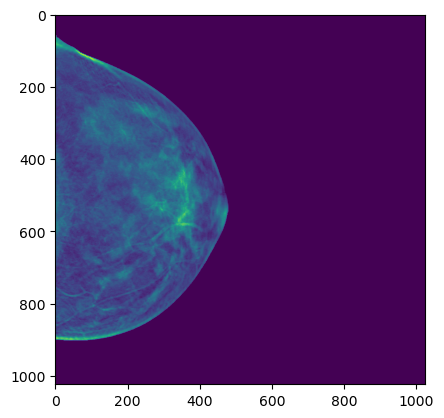

In [76]:
# plot the first slice of the first patient
plt.imshow(batch_of_slices[0][0])

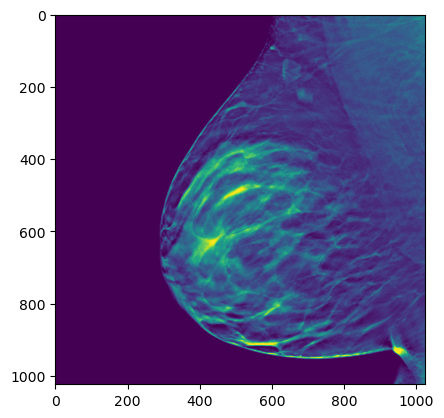

In [77]:
# plot the first slice of the first patient
plt.imshow(batch_of_slices[1][0])

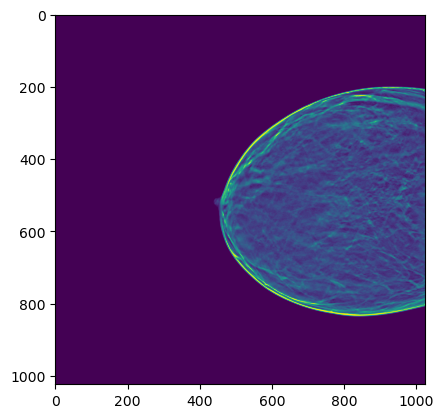

In [78]:
# plot the first slice of the first patient
plt.imshow(batch_of_slices[2][0])

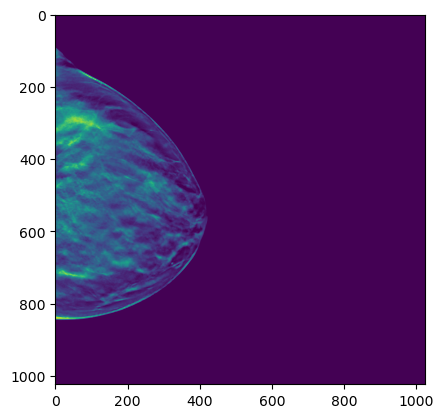

In [79]:
# plot the first slice of the first patient
plt.imshow(batch_of_slices[3][0])

In [81]:
train_loader = build_training_dataset(None)
print(len(train_loader))

291
